# Baixando dependências 

In [1]:
%pip install numpy
%pip install matplotlib
%pip install scipy
%pip install soundfile
%pip install Ipython

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.
Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.


# Importando bibliotecas

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import soundfile as sf
import IPython.display as ipd

# Carregando os dois áudios

In [3]:
seasons_violin1, fs = sf.read('Arquivos/Áudios/4Seasons_Violin1.wav')
canon_cello, fs = sf.read('Arquivos/Áudios/Canon_Cello.wav')


# Carregando as duas respostas aos impulsos

In [4]:
resp_imp_2 = np.genfromtxt('Arquivos/Medições/SEC_2.csv', delimiter=',') #Escolhido o ponto 2
resp_imp_4 = np.genfromtxt('Arquivos/Medições/SEC_4.csv', delimiter=',') #Escolhido o ponto 4


# Aplicando a convolução individual

In [5]:
saida_4sv1_esq = sp.signal.fftconvolve(seasons_violin1, resp_imp_2[:, 1])
saida_4sv1_dir = sp.signal.fftconvolve(seasons_violin1, resp_imp_2[:, 0])

saida_cc_esq = sp.signal.fftconvolve(canon_cello, resp_imp_4[:, 1])
saida_cc_dir = sp.signal.fftconvolve(canon_cello, resp_imp_4[:, 0])

# Aplicando a superposição para cada lado

In [6]:
saida_pt2_esq = saida_4sv1_esq[:min(len(saida_4sv1_esq), len(saida_cc_esq))] + saida_cc_esq[:min(len(saida_4sv1_esq), len(saida_cc_esq))]
saida_pt2_dir = saida_4sv1_dir[:min(len(saida_4sv1_dir), len(saida_cc_dir))] + saida_cc_dir[:min(len(saida_4sv1_dir), len(saida_cc_dir))]

# Unindo ambos

In [7]:
saida_pt2 = np.vstack((saida_pt2_esq, saida_pt2_dir)).transpose()

# Mostrando a saída

/home/caio/.local/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


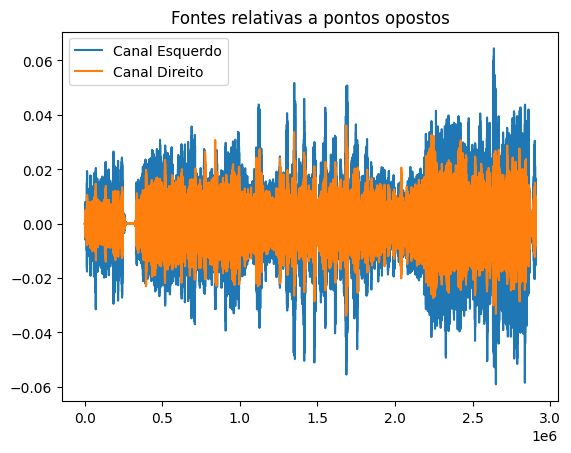

In [8]:
plt.plot(saida_pt2_esq, label="Canal Esquerdo")
plt.plot(saida_pt2_dir, label="Canal Direito")
plt.legend()
plt.title("Fontes relativas a pontos opostos")
plt.show()

# Salvando o resultado

In [9]:
sf.write("Arquivos/Saídas/saida_pt2.wav", saida_pt2 , fs)
ipd.Audio(filename='Arquivos/Saídas/saida_pt2.wav')